# Import Library

In [6]:
import json
import PIL
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import cv2

#  Loading json file

In [5]:
with open('data_file/new_one_box.json', 'r') as f:
    annos = json.load(f)

In [6]:
len(annos)

837

# Image Test (One Image)

img_size (220, 282)
box_size (201,271)
pad_ratio 0.4444444444444444
over!
crop_size (290, 277)
actual_y 95
actual_y 123
final_shape (184, 166, 3)


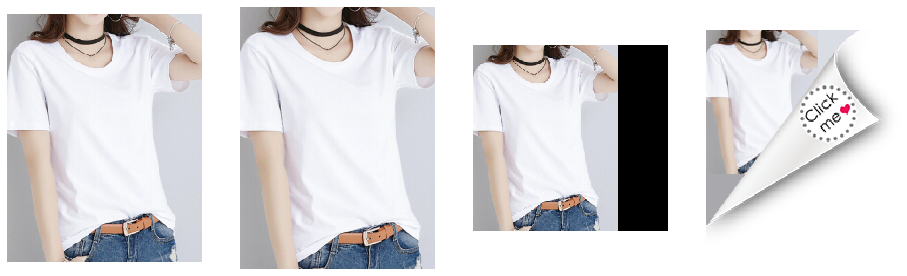

In [7]:
# Define small mask size
s_mask_width, s_mask_height = 130,166

# Define desire pixel
desire = 90

# Define image index for test
idx = 3

# get image
img = Image.open(annos[idx]['path'])
img_w, img_h = img.size
print('img_size',img.size)

# x,y,x,y coordinate & box size
x1, y1, x3, y3 = annos[idx]['xyxy']
box_width = x3 -x1
box_height = y3 - y1
print('box_size ('+str(int(box_width))+','+str(int(box_height))+')')

# calculate padding ration
pad_ratio = (s_mask_width - desire) / desire
print('pad_ratio',pad_ratio)

# calculate padding width
padded_width = box_width + x1 + box_width * pad_ratio

# crop original image
img_crop_o = img.crop((x1,y1,x3,y3))

# check img_w and padding width and crop image
if padded_width > img_w:
    print('over!')
    # choose : padded_width or img_w
    img_crop = img.crop((x1, y1, padded_width, img_h ))
else:
    img_crop = img.crop((x1,y1,padded_width, img_h ))
print('crop_size',img_crop.size)

crop_w, crop_h = img_crop.size

# resize iamge
scaling_ratio = s_mask_width / crop_w

new_width = s_mask_width
new_height = int(crop_h * scaling_ratio)

resize_det_image_pil_BICUBIC = img_crop.resize((new_width, new_height),resample=PIL.Image.BICUBIC)

# check actual_x and y
_, actual_y = resize_det_image_pil_BICUBIC.size
actual_y = actual_y - 1
actual_x = round((img_w - x1) * scaling_ratio -2)

print('actual_y', actual_x)
print('actual_y', actual_y)

# resize crop
resize_det_image_pil_BICUBIC = resize_det_image_pil_BICUBIC.crop((0,0, s_mask_width,s_mask_height))
new_w, new_h = resize_det_image_pil_BICUBIC.size

# to nparray
img_arr = np.asarray(resize_det_image_pil_BICUBIC)

# merge new mask
new_mask = np.zeros([184,166,3], dtype=np.int32)

new_mask[:new_h,:new_w,:]= img_arr

# padding specific pixel in blank
try:
    new_mask[actual_y:, :, :] = img_arr[actual_y,0,:]
    new_mask[:,actual_x:,:] = img_arr[1,actual_x,:]
except:
    pass
    
print('final_shape', new_mask.shape)

# make ad image
mask_np = np.asarray(Image.open('abf_file/mask_file.png','r'))
ad = Image.open('abf_file/ad_file.png','r')

# adding alpha channel
b_channel, g_channel, r_channel = cv2.split(new_mask)
alpha_channel = np.ones(g_channel.shape, dtype=b_channel.dtype) * 255 #creating a dummy alpha channel image.
img_a = cv2.merge((b_channel, g_channel, r_channel, alpha_channel))
img_a[:,:,3] = mask_np[:,:,3]

# composite alpha
mask_img = Image.fromarray(np.uint8(img_a))
final = Image.alpha_composite(ad, mask_img)

# show image
file_list = [img,img_crop_o, img_crop, final]
fig = plt.figure(figsize=(16,5))
for i in range(len(file_list)):
    a = fig.add_subplot(1, len(file_list), i+1)
    plt.imshow(file_list[i])
    #plt.axhline(actual_y)
    #plt.axvline(ttt)
    #plt.title(file_list[i])
    plt.axis('off')

# Image Test (Multiple images)

/root/anaconda3/envs/sypark/lib/python3.6/site-packages/ipykernel_launcher.py:93: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


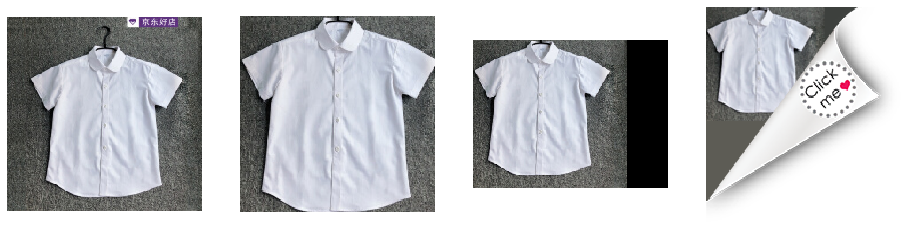

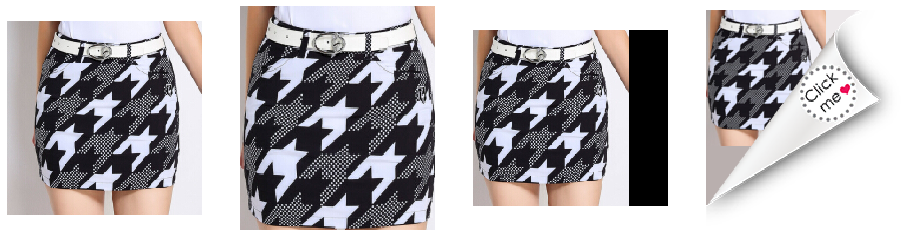

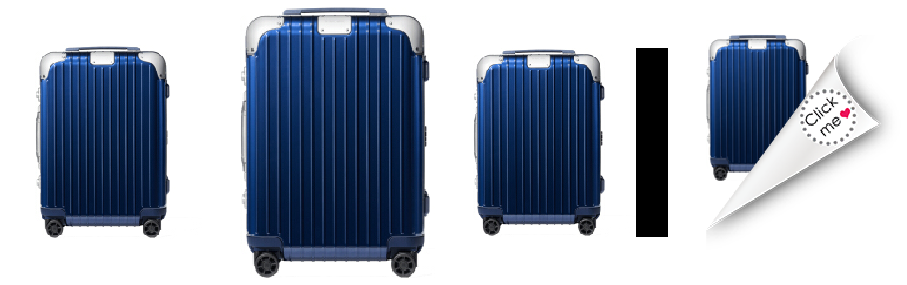

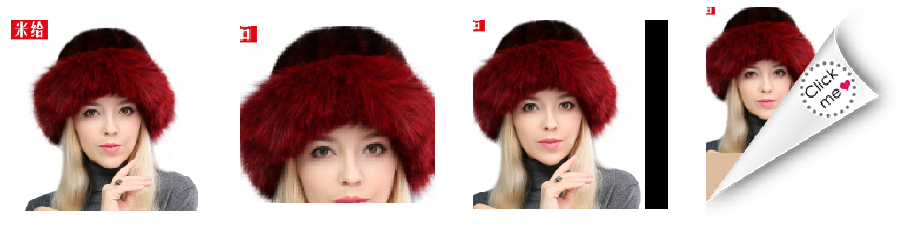

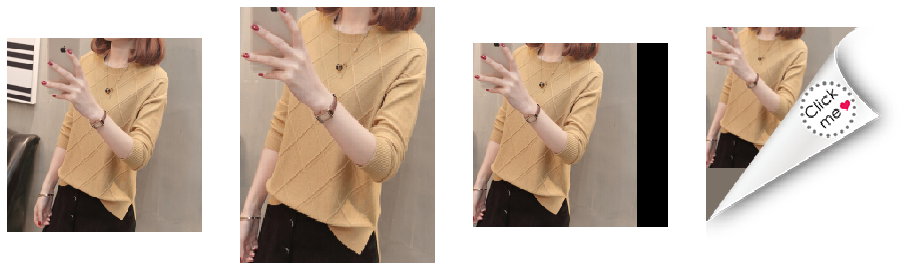

...

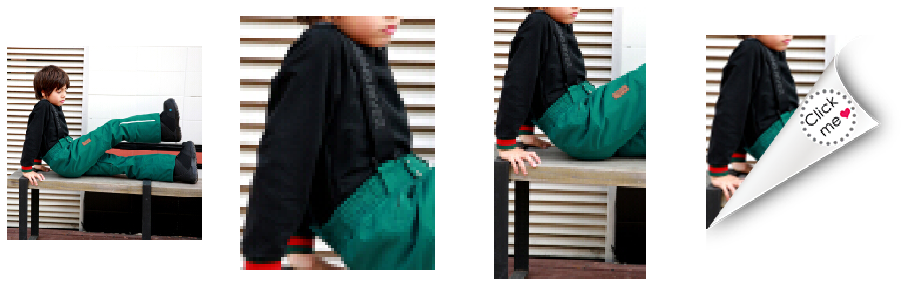

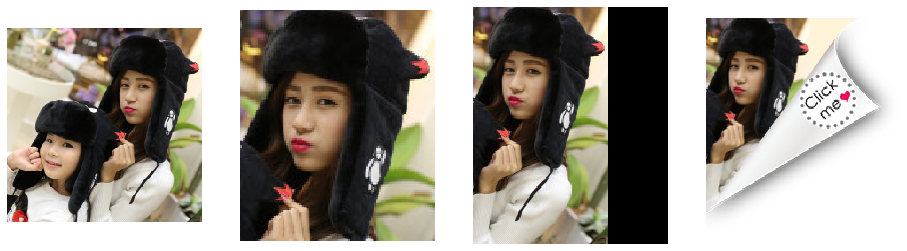

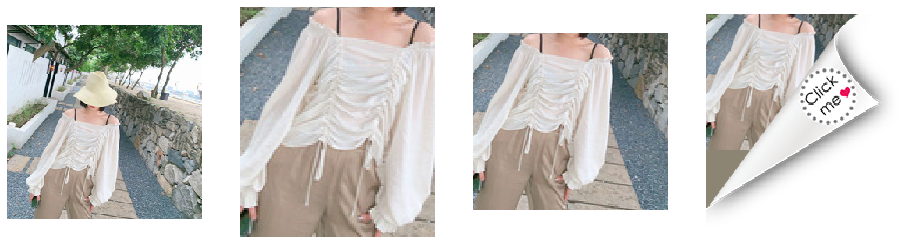

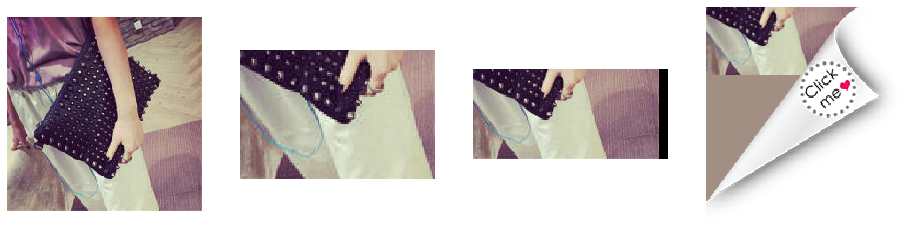

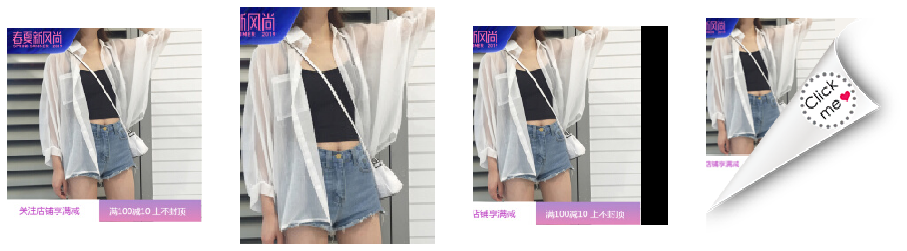

In [10]:
# Define small mask size
s_mask_width, s_mask_height = 130,166

# Define desire pixel
desire = 90

for idx in range(50):
    
    # get image
    try:
        img = Image.open(annos[idx]['path'])
        img_w, img_h = img.size
    except:
        pass
    
    '''
    if annos[idx]['label'] != 6.0:
        continue
    '''
    # x,y,x,y coordinate & box size
    x1, y1, x3, y3 = annos[idx]['xyxy']
    box_width = x3 -x1
    box_height = y3 - y1

    # calculate padding ration
    pad_ratio = (s_mask_width - desire) / desire

    # calculate padding width
    padded_width = box_width + x1 + box_width * pad_ratio

    # crop original image
    img_crop_o = img.crop((x1,y1,x3,y3))

    # check img_w and padding width and crop image
    if padded_width > img_w:
        # choose : padded_width or img_w
        img_crop = img.crop((x1, y1, padded_width, img_h ))
    else:
        img_crop = img.crop((x1,y1,padded_width, img_h ))
    
    crop_w, crop_h = img_crop.size

    # resize iamge
    scaling_ratio = s_mask_width / crop_w

    new_width = s_mask_width
    new_height = int(crop_h * scaling_ratio)

    resize_det_image_pil_BICUBIC = img_crop.resize((new_width, new_height),resample=PIL.Image.BICUBIC)

    # check actual_x and y
    actual_x, actual_y = resize_det_image_pil_BICUBIC.size
    actual_y = actual_y - 1
    actual_x = round((img_w - x1) * scaling_ratio -2)

    # resize crop
    resize_det_image_pil_BICUBIC = resize_det_image_pil_BICUBIC.crop((0,0, s_mask_width,s_mask_height))
    new_w, new_h = resize_det_image_pil_BICUBIC.size

    # to nparray
    img_arr = np.asarray(resize_det_image_pil_BICUBIC)

    try:
        # merge new mask
        new_mask = np.zeros([184,166,3], dtype=np.int32)
        new_mask[:new_h,:new_w,:]= img_arr
    except:
        continue

    # padding specific pixel in blank
    try:
        new_mask[actual_y:, :, :] = img_arr[actual_y,1,:]
        new_mask[:,actual_x:,:] = img_arr[1,actual_x,:]
    except:
        pass

    # make ad image
    mask_np = np.asarray(Image.open('mask_file.png','r'))
    ad = Image.open('ad_file.png','r')

    # adding alpha channel
    b_channel, g_channel, r_channel = cv2.split(new_mask)
    alpha_channel = np.ones(g_channel.shape, dtype=b_channel.dtype) * 255 #creating a dummy alpha channel image.
    img_a = cv2.merge((b_channel, g_channel, r_channel, alpha_channel))
    img_a[:,:,3] = mask_np[:,:,3]

    # composite alpha
    mask_img = Image.fromarray(np.uint8(img_a))
    final = Image.alpha_composite(ad, mask_img)
    
    file_list = [img, final]
    #ile_list = [img,img_crop_o, img_crop, final]
    fig = plt.figure(figsize=(16,5))
    for i in range(len(file_list)):
        a = fig.add_subplot(1, len(file_list), i+1)
        plt.imshow(file_list[i])
        #plt.title(file_list[i])
        #plt.axvline(actual_x)
        #plt.axhline(actual_y)
        plt.axis('off')